In [1]:
n_exp_model = '2'
TEST_IMAGES = f'../datasets/Test/images/'
WEIGHTS = f'./runs/train/exp{n_exp_model}/weights/best.pt'

In [2]:
# !/home/shaohyan/anaconda3/envs/tf38/bin/python detect.py --source {TEST_IMAGES} --weights {WEIGHTS} --img-size 512 --max-det 4 --device 0,1,2,3 --save-txt --save-conf --nosave --conf-thres 0.02 --iou-thres 0.65

# !/home/shaohyan/anaconda3/envs/tf38/bin/python detect.py --source {TEST_IMAGES} --weights {WEIGHTS} --img-size 512 --max-det 4 --device 0,1,2,3 --save-txt --save-conf --nosave --conf-thres 0.001

!/home/shaohyan/anaconda3/envs/tf38/bin/python detect.py --source {TEST_IMAGES} --weights {WEIGHTS} --img-size 512 --device cpu --save-txt --save-conf --nosave --conf-thres 0.001

detect: weights=['./runs/train/exp2/weights/best.pt'], source=../datasets/Test/images/, imgsz=[512, 512], conf_thres=0.001, iou_thres=0.45, max_det=1000, device=cpu, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=True, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 e685c48 torch 1.9.1+rocm4.2 CPU

Fusing layers... 
Model Summary: 367 layers, 46119048 parameters, 0 gradients, 107.8 GFLOPs
image 1/931 /home/shaohyan/.test/Passion-Fruit-Disease-Detection/Test_Images/ID_0082Y2NI.jpg: 512x512 2 fruit_woodinesss, Done. (7.051s)
image 2/931 /home/shaohyan/.test/Passion-Fruit-Disease-Detection/Test_Images/ID_00DCPV52.jpg: 512x512 2 fruit_brownspots, Done. (7.005s)
image 3/931 /home/shaohyan/.test/Passion-Fruit-Disease-Detection/Test_Images/ID_038S0ONN.jpg: 512x512 4 fruit_healthys, Done. (7.039s)
image 4/931

In [4]:
import os
import pandas as pd

def get_output(n_exp_detect, exclude=None):
    category_index = {0: {'id': 0, 'name': 'fruit_healthy'},
                    1: {'id': 1, 'name': 'fruit_woodiness'},
                     2: {'id': 3, 'name': 'fruit_brownspot'}}

    path = f'./runs/detect/exp{n_exp_detect}/labels/'
    filelist = os.listdir(path) 
    df_write = pd.DataFrame(columns = ['Image_ID', 'class', 'confidence', 'ymin','xmin','ymax','xmax'])

    img_size = 512

    for file in filelist:
        if (file[-3:] == 'txt') and (True if exclude is None else file.split('.')[0] not in exclude):
            data = pd.read_csv(path + file, sep=" ", header=None)
            data = data.rename(columns={0:'class',1:'x',2:'y',3:'w',4:'h',5:'confidence'})
            data['class'] = data['class'].apply(lambda x: category_index[x]['name'])
            data['ymin'] = (data['y'] - data['h'] / 2) * img_size
            data['xmin'] = (data['x'] - data['w'] / 2) * img_size
            data['ymax'] = (data['y'] + data['h'] / 2) * img_size
            data['xmax'] = (data['x'] + data['w'] / 2) * img_size
            data['Image_ID'] = file.split('.')[0]

            cols = ['Image_ID','class','confidence','ymin',	'xmin',	'ymax',	'xmax']
            data = data[cols]

            df_write = df_write.append(data.nlargest(4, 'confidence'))

    df_write['ymin'] = df_write['ymin'].apply(lambda x: max(x, 0))
    df_write['xmin'] = df_write['xmin'].apply(lambda x: max(x, 0))
    df_write['ymax'] = df_write['ymax'].apply(lambda x: min(x, img_size))
    df_write['xmax'] = df_write['xmax'].apply(lambda x: min(x, img_size))
    return df_write

In [6]:
n_exp_detect = ''
df_write = get_output(n_exp_detect)

In [ ]:
# import os
# import pandas as pd

# category_index = {0: {'id': 0, 'name': 'fruit_healthy'},
#                 1: {'id': 1, 'name': 'fruit_woodiness'},
#                  2: {'id': 3, 'name': 'fruit_brownspot'}}

# n_exp_detect = '6'
# path = f'./runs/detect/exp{n_exp_detect}/labels/'
# filelist = os.listdir(path) 
# df_write = pd.DataFrame(columns = ['Image_ID', 'class', 'confidence', 'ymin','xmin','ymax','xmax'])

# img_size = 512

# for file in filelist:
#     if file[-3:] == 'txt':
#         data = pd.read_csv(path + file, sep=" ", header=None)
#         data = data.rename(columns={0:'class',1:'x',2:'y',3:'w',4:'h',5:'confidence'})
#         data['class'] = data['class'].apply(lambda x: category_index[x]['name'])
#         data['ymin'] = (data['y'] - data['h'] / 2) * img_size
#         data['xmin'] = (data['x'] - data['w'] / 2) * img_size
#         data['ymax'] = (data['y'] + data['h'] / 2) * img_size
#         data['xmax'] = (data['x'] + data['w'] / 2) * img_size
#         data['Image_ID'] = file.split('.')[0]

#         cols = ['Image_ID','class','confidence','ymin',	'xmin',	'ymax',	'xmax']
#         data = data[cols]

#         df_write = df_write.append(data.nlargest(4, 'confidence'))
        
# df_write['ymin'] = df_write['ymin'].apply(lambda x: max(x, 0))
# df_write['xmin'] = df_write['xmin'].apply(lambda x: max(x, 0))
# df_write['ymax'] = df_write['ymax'].apply(lambda x: min(x, img_size))
# df_write['xmax'] = df_write['xmax'].apply(lambda x: min(x, img_size))

# # high_conf, low_conf = df_write[df_write.confidence >= 0.25], df_write[df_write.confidence < 0.25]
# # df_missing = low_conf[~low_conf.Image_ID.isin(high_conf.Image_ID.unique())].reset_index()
# # df_missing_rank = df_missing.groupby('Image_ID')['confidence'].rank('dense', ascending = False)
# # df_append = df_missing[df_missing_rank == 1]
# # df_final = pd.concat([high_conf, df_append])

In [7]:
df_write.Image_ID.nunique()

929

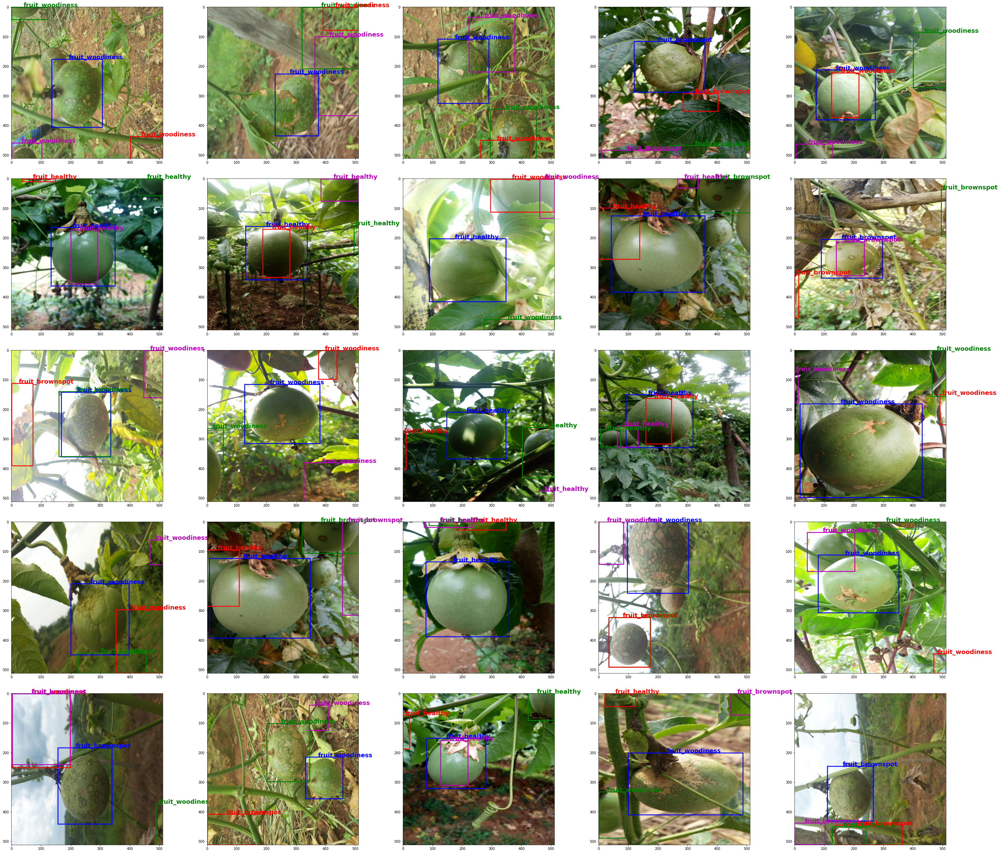

In [8]:
import sys 
sys.path.append('../..')
from helper import plot_sample_images, plot_sample_images_multi

plot_sample_images_multi(df_write, dir_path='../..', is_train=False, convert=True)

In [ ]:
n_exp_detect = '9'
df_additional = get_output(n_exp_detect, exclude=df_write.Image_ID.unique())
df_final = pd.concat([df_write, df_additional])

In [ ]:
df_final.to_csv('../../submission.csv', encoding='utf-8', index=False)

In [9]:
df_write.to_csv('../../submission.csv', encoding='utf-8', index=False)